In [1]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import anndata 
import seaborn as sns
from scipy.stats import zscore
from scipy import sparse 
import itertools

import matplotlib.pyplot as plt
import collections
from sklearn.cluster import KMeans
from sklearn import metrics

from sklearn.decomposition import PCA
from umap import UMAP

from matplotlib.colors import LinearSegmentedColormap

from scroutines.config_plots import *
from scroutines import powerplots # .config_plots import *
from scroutines import pnmf
from scroutines import basicu


/home/qlyu/mambaforge/envs/bbbroutine/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def plot_pcs(res, npc, hue, palette=None):
    fig, axs = plt.subplots(npc-1,npc-1,figsize=(6*(npc-1),5*(npc-1)))
    for i, j in itertools.combinations(range(npc), 2):
        legend = False
        if (i,j) == (0,1): legend=True

        x, y = f"PC{j+1}", f"PC{i+1}"
        ax = axs[i,j-1]
        
        if palette is not None:
            sns.scatterplot(data=res.sample(frac=1, replace=False), 
                            x=x, y=y, 
                            hue=hue,
                            hue_order=list(palette.keys()),
                            palette=palette,
                            s=5, edgecolor='none', 
                            legend=legend,
                            ax=ax,
                           )
        else:
            sns.scatterplot(data=res.sample(frac=1, replace=False), 
                            x=x, y=y, 
                            hue=hue,
                            # hue_order=list(palette.keys()),
                            # palette=palette,
                            s=5, edgecolor='none', 
                            legend=legend,
                            ax=ax,
                           )
        sns.despine(ax=ax)
    axs[0,0].legend(bbox_to_anchor=(0.5, -0.2), loc='upper center')

    for i, j in itertools.product(range(npc-1), range(npc-1)):
        if j<i:
            ax = axs[i,j]
            ax.axis('off')

    plt.show()

In [3]:
outdir     = "/data/qlyu/v1/results"
outdir_fig = "/data/qlyu/v1/figures"

In [4]:
adata_raw = anndata.read("../../data/cheng21_cell_scrna/reorganized/all_IT.h5ad")
adata_raw = adata_raw[adata_raw.obs['Subclass']=='L2/3']
adata_raw = adata_raw[adata_raw.obs['cond'].isin(['P28NR','P28DR'])]
counts = adata_raw.X
allgenes = adata_raw.var.index.values
adata_raw

View of AnnData object with n_obs × n_vars = 8748 × 53801
    obs: 'Class_broad', 'Doublet', 'Doublet Score', 'batch', 'leiden', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'cond'

In [5]:
# get updated cell types
f = "/data/qlyu/v1/results/allL23_newtypes.csv"
meta = pd.read_csv(f, index_col=0)
meta

/tmp/ipykernel_3841862/716257834.py:3: DtypeWarning: Columns (1,4) have mixed types. Specify dtype option on import or set low_memory=False.
  meta = pd.read_csv(f, index_col=0)


,Class_broad,Doublet,Doublet Score,batch,leiden,n_counts,n_genes,percent_mito,sample,Type,Subclass,cond,easitype,umap1,umap2,easisample,easicond,newtype
AAACGCTCACTTCATT-1-P8_1a-P8,Excitatory,False,0.025713,1,0,23384.0,4943,0.000128,P8_1a,L2/3_AB,L2/3,P8NR,L2/3_A,NaN,NaN,1a,1-P08NR,L2/3_A
AAAGGATAGGTGCATG-1-P8_1a-P8,Excitatory,False,0.011883,1,0,17774.0,4698,0.000169,P8_1a,L2/3_AB,L2/3,P8NR,L2/3_A,NaN,NaN,1a,1-P08NR,L2/3_A
AAAGGGCCAGTATACC-1-P8_1a-P8,Excitatory,False,0.024667,1,0,15872.0,4173,0.000126,P8_1a,L2/3_AB,L2/3,P8NR,L2/3_A,NaN,NaN,1a,1-P08NR,L2/3_A
AAAGTCCCATATACCG-1-P8_1a-P8,Excitatory,False,0.027921,1,0,20076.0,4761,0.000050,P8_1a,L2/3_AB,L2/3,P8NR,L2/3_A,NaN,NaN,1a,1-P08NR,L2/3_A
AAAGTCCTCAGATGCT-1-P8_1a-P8,Excitatory,False,0.009527,1,4,19061.0,4601,0.000000,P8_1a,L2/3_BC,L2/3,P8NR,L2/3_C,NaN,NaN,1a,1-P08NR,L2/3_C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTCAGTTGTTG-1-P38_dr_1a,NaN,False,0.042872,11,1,11379.0,3568,0.000879,P38_dr_1a,L2/3_3,L2/3,P38DR,L2/3_C,NaN,NaN,1a,2-P38DR,L2/3_B
TTTGGTTTCTGCCTGT-1-P38_dr_2b,NaN,False,0.007108,2,1,16050.0,3104,0.000062,P38_dr_2b,L2/3_3,L2/3,P38DR,L2/3_C,NaN,NaN,2b,2-P38DR,L2/3_B
TTTGTTGCACCGGTCA-1-P38_dr_2a,NaN,False,0.030928,2,1,13955.0,3739,0.001146,P38_dr_2a,L2/3_3,L2/3,P38DR,L2/3_C,NaN,NaN,2a,2-P38DR,L2/3_B
TTTGTTGGTGGCTAGA-1-P38_dr_2b,NaN,False,0.015884,3,4,7272.0,2789,0.000963,P38_dr_2b,L2/3_2,L2/3,P38DR,L2/3_B,NaN,NaN,2b,2-P38DR,L2/3_A


In [6]:
# update new type 
adata_raw.obs['newtype'] = adata_raw.obs['Type'].copy()
adata_raw.obs.update(meta[['newtype']])

/tmp/ipykernel_3841862/3478751590.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_raw.obs['newtype'] = adata_raw.obs['Type'].copy()


In [7]:
conds = adata_raw.obs['cond'].values
types = adata_raw.obs['Type'].values
newtypes = adata_raw.obs['newtype'].values
samps = adata_raw.obs['sample'].values

rename_dict = {
    "L2/3_A": "L2/3_A",
    "L2/3_B": "L2/3_B",
    "L2/3_C": "L2/3_C",
    
    "L2/3_1": "L2/3_A",
    "L2/3_2": "L2/3_B",
    "L2/3_3": "L2/3_C",
    
    "L2/3_AB": "L2/3_A",
    "L2/3_BC": "L2/3_C",
}

def rename(x):
    """
    """
    if x in rename_dict.keys():
        return rename_dict[x]
    else:
        return x
    
adata_raw.obs['easitype'] = adata_raw.obs['Type'].apply(rename)

In [8]:
# use those 286 genes
# df = pd.read_csv("../../data/cheng21_cell_scrna/res/candidate_genes_vincent_0503_v2.csv")
df = pd.read_csv("../../data/cheng21_cell_scrna/res/L23-ABC-genes-n288-n286unq-annot.csv")
genes_l23 = df['gene'].values
# genes_sel = adata_raw.var.index.values
# genes_grp = df['P17on'].astype(str).values
# assert len(genes_sel) == len(np.unique(genes_sel))

# Use P28 ordering
f = '../../results/gene_ptime_P28_L23_Mar27.tsv'
gpt = pd.read_csv(f)
gpt = gpt['gene_ptime'].values
gptidx = np.argsort(gpt)

In [9]:
# filter genes
cond = np.ravel((adata_raw.X>0).sum(axis=0)) > 10 # expressed in more than 10 cells
adata_sub = adata_raw[:,cond]

# counts
x = adata_sub.X
cov = adata_sub.obs['n_counts'].values
genes = adata_sub.var.index.values

# CP10k
xn = (sparse.diags(1/cov).dot(x))*1e4

# log10(CP10k+1)
xln = xn.copy()
xln.data = np.log10(xln.data+1)

adata_sub.layers['norm'] = xn
adata_sub.layers['lognorm'] = xln

In [10]:
# select HVGs with mean and var
nbin = 20
qth = 0.3

# mean
gm = np.ravel(xn.mean(axis=0))

# var
tmp = xn.copy()
tmp.data = np.power(tmp.data, 2)
gv = np.ravel(tmp.mean(axis=0))-gm**2

# cut 
lbl = pd.qcut(gm, nbin, labels=np.arange(nbin))

# organize
gres = pd.DataFrame()
gres['name'] = genes
gres['lbl'] = lbl
gres['mean'] = gm
gres['var'] = gv
gres['ratio']= gv/gm

# select
gres_sel = gres.groupby('lbl')['ratio'].nlargest(int(qth*(len(gm)/nbin))) #.reset_index()
gsel_idx = np.sort(gres_sel.index.get_level_values(1).values)
assert np.all(gsel_idx != -1)

In [11]:
l23_gidx = basicu.get_index_from_array(genes, genes_l23)
assert np.all(l23_gidx != -1)

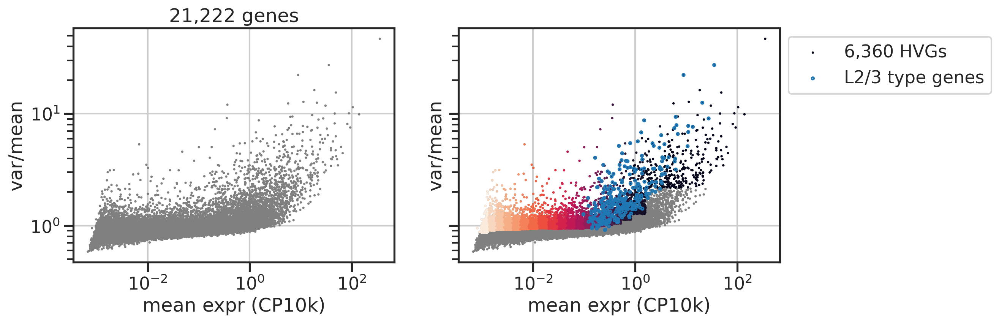

In [12]:
fig, axs = plt.subplots(1,2, figsize=(6*2,4), sharex=True, sharey=True)
ax = axs[0]
ax.scatter(gm, gv/gm, s=5, edgecolor='none', color='gray')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('mean expr (CP10k)')
ax.set_ylabel('var/mean')
ax.set_title(f'{len(gm):,} genes')

ax = axs[1]
ax.scatter(gm, gv/gm, s=5, edgecolor='none', color='gray')
ax.scatter(gm[gsel_idx], (gv/gm)[gsel_idx], c=lbl[gsel_idx], s=5, edgecolor='none', cmap='rocket_r', label=f'{len(gsel_idx):,} HVGs')
ax.scatter(gm[l23_gidx], (gv/gm)[l23_gidx], s=5, facecolors='none', edgecolor='C0', label='L2/3 type genes')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('mean expr (CP10k)')
ax.set_ylabel('var/mean')
ax.legend(bbox_to_anchor=(1,1))

plt.show()

In [30]:
output = os.path.join(outdir, 'P28background_genes_June30.csv')
gres_sub = gres.loc[gsel_idx]
print(gres_sub.shape)
gres_sub = gres_sub[gres_sub['mean'] > 1e-1]
print(gres_sub.shape)
gres_sub = gres_sub[gres_sub['name'].apply(lambda x: x[:2])!='mt']
print(gres_sub.shape)
gres_sub.to_csv(output)
gres_sub

(6360, 5)
(2532, 5)
(2524, 5)


,name,lbl,mean,var,ratio
0,Xkr4,19,5.719649,12.745029,2.228289
1,Gm1992,13,0.179494,0.181980,1.013848
14,Rgs20,19,1.876913,4.692412,2.500069
31,3110035E14Rik,15,0.354849,0.368611,1.038780
35,Sgk3,17,0.827651,1.037357,1.253374
...,...,...,...,...,...
21162,Dclre1a,13,0.142666,0.152255,1.067208
21163,Nhlrc2,17,0.735169,0.853722,1.161260
21169,B230217O12Rik,12,0.135483,0.133956,0.988727
21196,Grk5,15,0.305893,0.387584,1.267058


In [13]:
adata = adata_sub[:,gsel_idx]
genes_sel = adata.var.index.values
adata

View of AnnData object with n_obs × n_vars = 8748 × 6360
    obs: 'Class_broad', 'Doublet', 'Doublet Score', 'batch', 'leiden', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'cond', 'newtype', 'easitype'
    layers: 'norm', 'lognorm'

In [14]:
adata_nr = adata[adata.obs['cond']=='P28NR']
adata_dr = adata[adata.obs['cond']=='P28DR']
adata_nr, adata_dr

(View of AnnData object with n_obs × n_vars = 4044 × 6360
     obs: 'Class_broad', 'Doublet', 'Doublet Score', 'batch', 'leiden', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'cond', 'newtype', 'easitype'
     layers: 'norm', 'lognorm',
 View of AnnData object with n_obs × n_vars = 4704 × 6360
     obs: 'Class_broad', 'Doublet', 'Doublet Score', 'batch', 'leiden', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'cond', 'newtype', 'easitype'
     layers: 'norm', 'lognorm')

In [15]:
#
lognorm_nr = np.array(adata_nr.layers['lognorm'].todense())
zlognorm_nr = zscore(lognorm_nr, axis=0) # for each gene across cells

# 
lognorm_dr = np.array(adata_dr.layers['lognorm'].todense())
zlognorm_dr = zscore(lognorm_dr, axis=0) # for each gene across cells

In [16]:
lognorm_nr.shape

(4044, 6360)

In [17]:
%%time

np.random.seed(0)
pca_nr = PCA(n_components=50)
pcs_nr = pca_nr.fit_transform(zlognorm_nr)
# ucs_nr = UMAP(n_components=2, n_neighbors=50).fit_transform(pcs_nr)
pca_dr = PCA(n_components=50)
pcs_dr = pca_dr.fit_transform(zlognorm_dr)


CPU times: user 26.9 s, sys: 40 s, total: 1min 6s
Wall time: 1.9 s


In [18]:
# get results
res_nr = adata_nr.obs.copy()
res_nr['biosamp'] = res_nr['sample'].apply(lambda x: x[:-1])
res_nr['type'] = res_nr['Type']
res_nr = res_nr.join(pd.DataFrame(pcs_nr, index=res_nr.index, columns=np.char.add("PC", ((1+np.arange(pcs_nr.shape[1])).astype(str)))))
# res_nr['umap1'] = ucs_nr[:,0]
# res_nr['umap2'] = ucs_nr[:,1]
res_nr

# get results
res_dr = adata_dr.obs.copy()
res_dr['biosamp'] = res_dr['sample'].apply(lambda x: x[:-1])
res_dr['type'] = res_dr['Type']
res_dr = res_dr.join(pd.DataFrame(pcs_dr, index=res_dr.index, columns=np.char.add("PC", ((1+np.arange(pcs_dr.shape[1])).astype(str)))))
# res_dr['umap1'] = ucs_dr[:,0]
# res_dr['umap2'] = ucs_dr[:,1]
res_dr

,Class_broad,Doublet,Doublet Score,batch,leiden,n_counts,n_genes,percent_mito,sample,Type,...,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50
AAACCCAAGTGCACCC-1-P28_dr_1b,NaN,False,0.041447,2,1,17705.0,4607,0.001694,P28_dr_1b,L2/3_3,...,1.158613,0.779397,0.839267,1.047866,0.243497,0.608365,-1.141176,-1.060046,1.081579,-0.157967
AAACCCACAAGGCCTC-1-P28_dr_3b,NaN,False,0.039692,3,4,17453.0,3856,0.000057,P28_dr_3b,L2/3_1,...,2.687140,0.504495,-0.398095,0.942354,1.447748,0.849441,-1.077492,2.094380,-0.012481,0.702537
AAACCCATCCCATAAG-1-P28_dr_1a,NaN,False,0.024050,1,4,12538.0,4026,0.000478,P28_dr_1a,L2/3_1,...,0.839225,-1.060109,-0.484693,2.249718,-0.658400,4.215586,0.851367,0.468029,0.441894,6.366104
AAACGAAAGAGAGAAC-1-P28_dr_3a,NaN,False,0.036515,2,1,8565.0,3048,0.000233,P28_dr_3a,L2/3_3,...,-0.276260,-0.571051,-0.136564,0.815729,-0.968489,2.995954,0.333607,1.067075,2.342670,-0.843139
AAACGAAAGGTCACCC-1-P28_dr_3b,NaN,False,0.014417,2,1,10380.0,2882,0.000193,P28_dr_3b,L2/3_3,...,0.629046,-1.664027,-1.153847,-0.609194,-0.615108,-1.624240,-0.348667,0.043294,-1.257313,0.286498
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTAGTAACCGG-1-P28_dr_1b,NaN,False,0.059424,1,3,17456.0,5227,0.001031,P28_dr_1b,L2/3_2,...,-0.717128,1.087978,-1.933851,1.250145,0.130965,-0.290540,-0.284115,1.946603,1.510559,-2.064799
TTTGGTTTCCGAGTGC-1-P28_dr_1a,NaN,False,0.113208,3,4,18071.0,4987,0.000443,P28_dr_1a,L2/3_1,...,-0.916221,-0.210254,1.767871,-0.369260,0.294534,1.703372,3.840932,-0.553738,2.718263,1.856639
TTTGTTGCAACGGCCT-1-P28_dr_3b,NaN,False,0.022076,1,3,10881.0,3526,0.001011,P28_dr_3b,L2/3_2,...,-3.322467,-1.128727,-0.594186,0.088593,3.484754,-2.407723,-1.883774,-0.133428,-1.340389,-0.931726
TTTGTTGGTTGCACGC-1-P28_dr_3a,NaN,False,0.035517,1,3,11508.0,3593,0.000174,P28_dr_3a,L2/3_2,...,-0.912881,-1.358033,1.092441,-1.486185,0.989403,1.802515,-1.512322,-0.482122,-0.417120,2.049027


# correlate PCs

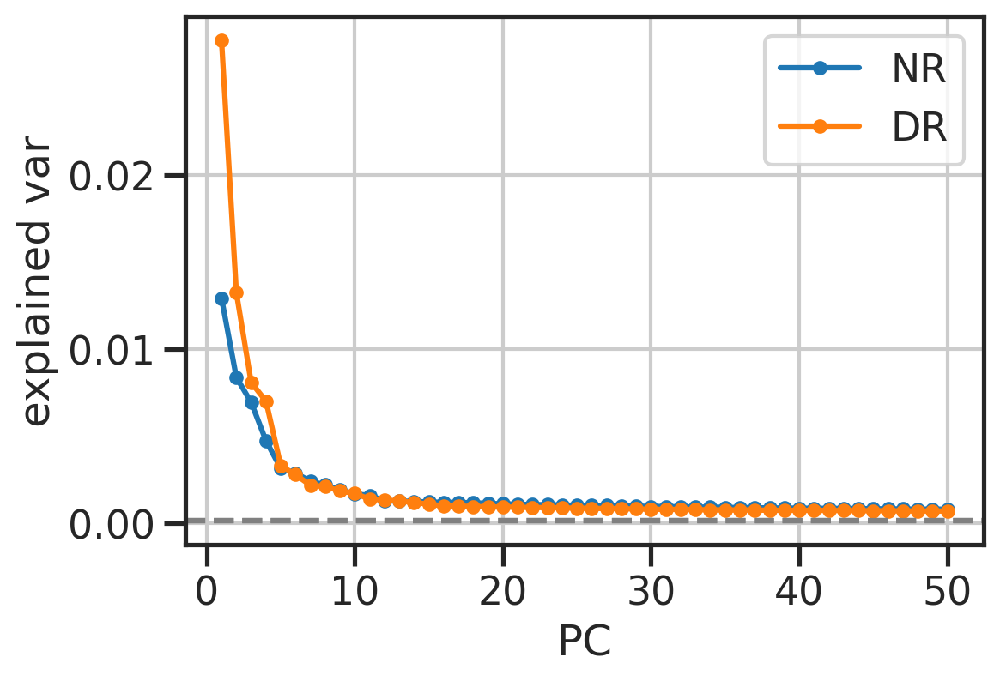

In [19]:
fig, ax = plt.subplots(figsize=(6,4))
ax.plot(np.arange(len(pca_nr.explained_variance_ratio_))+1, pca_nr.explained_variance_ratio_, '-o', markersize=5, label='NR')
ax.axhline(1/lognorm_nr.shape[1], linestyle='--', color='gray')

ax.plot(np.arange(len(pca_dr.explained_variance_ratio_))+1, pca_dr.explained_variance_ratio_, '-o', markersize=5, label='DR')
ax.axhline(1/lognorm_dr.shape[1], linestyle='--', color='gray')

ax.set_xlabel('PC')
ax.set_ylabel('explained var')
ax.legend()

In [20]:
vt_nr = pca_nr.components_
vt_dr = pca_dr.components_
vt_nr.shape, vt_dr.shape

((50, 6360), (50, 6360))

In [21]:
pcs_nr.shape

(4044, 50)

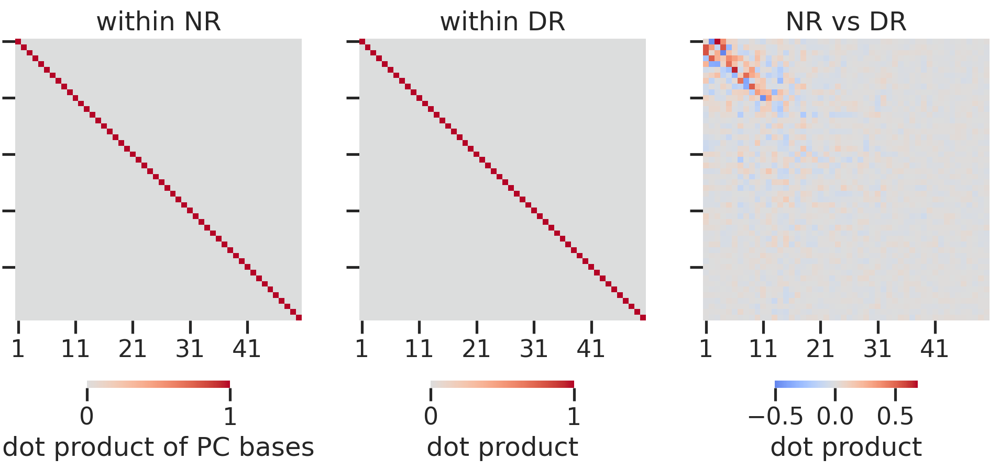

In [22]:
fig, axs = plt.subplots(1,3,figsize=(3*4,1*5), sharex=True, sharey=True)

ax = axs[0]
sns.heatmap(vt_nr.dot(vt_nr.T), cmap='coolwarm', center=0, ax=ax, 
            xticklabels=10,yticklabels=10, 
            cbar_kws=dict(location='bottom', shrink=0.5, label='dot product of PC bases'))
ax.set_xticklabels([int(i.get_text())+1 for i in ax.get_xticklabels()])
ax.set_yticklabels([int(i.get_text())+1 for i in ax.get_yticklabels()])
ax.set_title('within NR')
ax = axs[1]
sns.heatmap(vt_dr.dot(vt_dr.T), cmap='coolwarm', center=0, ax=ax, 
            xticklabels=10,yticklabels=10, 
            cbar_kws=dict(location='bottom', shrink=0.5, label='dot product'))
ax.set_xticklabels([int(i.get_text())+1 for i in ax.get_xticklabels()])
ax.set_yticklabels([int(i.get_text())+1 for i in ax.get_yticklabels()])
ax.set_title('within DR')
ax = axs[2]
sns.heatmap(vt_nr.dot(vt_dr.T), cmap='coolwarm', center=0, ax=ax, 
            xticklabels=10,yticklabels=10, 
            cbar_kws=dict(location='bottom', shrink=0.5, label='dot product'))
ax.set_xticklabels([int(i.get_text())+1 for i in ax.get_xticklabels()])
ax.set_yticklabels([int(i.get_text())+1 for i in ax.get_yticklabels()])
ax.set_title('NR vs DR')
plt.show()

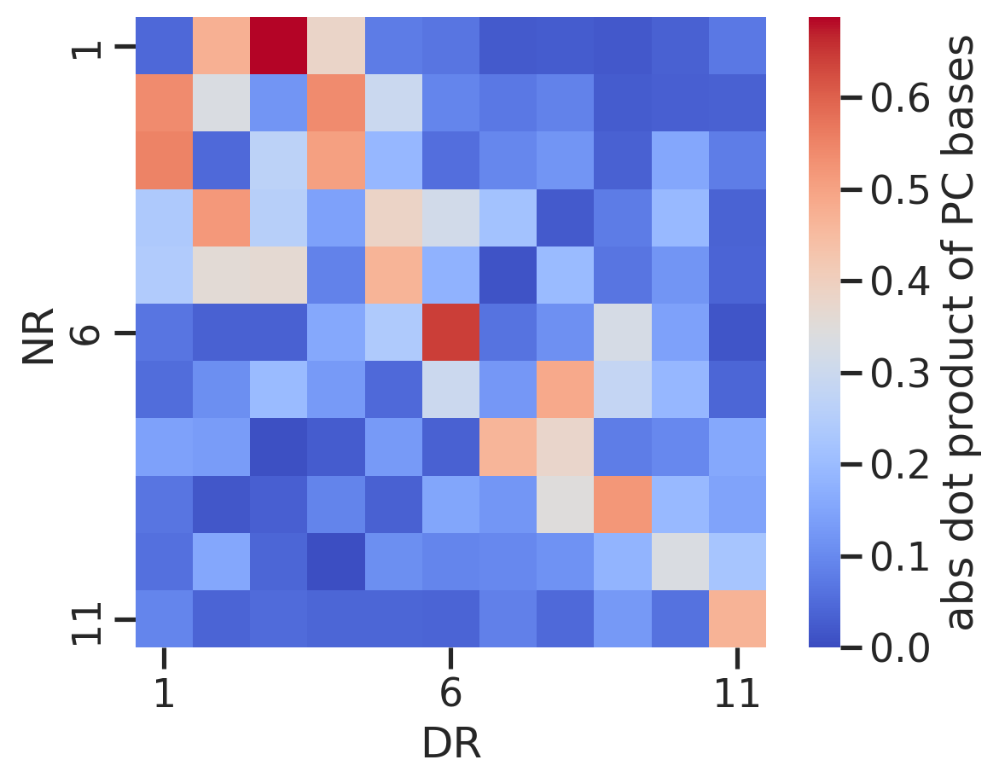

In [23]:
fig, ax = plt.subplots()
sns.heatmap(np.abs(vt_nr[:11].dot(vt_dr[:11].T)), 
            cmap='coolwarm', vmin=0, 
            xticklabels=5, yticklabels=5, 
            cbar_kws=dict(label='abs dot product of PC bases'),
            ax=ax,
           )
ax.set_xticklabels([int(i.get_text())+1 for i in ax.get_xticklabels()])
ax.set_yticklabels([int(i.get_text())+1 for i in ax.get_yticklabels()])
ax.set_aspect('equal')
ax.set_ylabel('NR')
ax.set_xlabel('DR')
plt.show()

In [24]:
colors = sns.color_palette('tab20', 10)
# 6-9
palette_biosamp = {
    'P28_1': colors[6],
    'P28_2': colors[7],
    
    'P28_dr_1': colors[8],
    'P28_dr_3': colors[9],
}
palette_cond = {
    'P28NR': colors[6],
    'P28DR': colors[8],
}

# 0-5
palette_type = {
    'L2/3_A': colors[0],
    'L2/3_B': colors[2],
    'L2/3_C': colors[4],
    
    'L2/3_1': colors[1],
    'L2/3_2': colors[3],
    'L2/3_3': colors[5],
}
palette_type_abc = {
    'L2/3_A': colors[0],
    'L2/3_B': colors[2],
    'L2/3_C': colors[4],
    
    'L2/3_1': 'lightgray',
    'L2/3_2': 'lightgray',
    'L2/3_3': 'lightgray',
}
colors

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.7333333333333333, 0.47058823529411764),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (1.0, 0.596078431372549, 0.5882352941176471),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.7725490196078432, 0.6901960784313725, 0.8352941176470589)]

# NR

In [25]:
res = res_nr

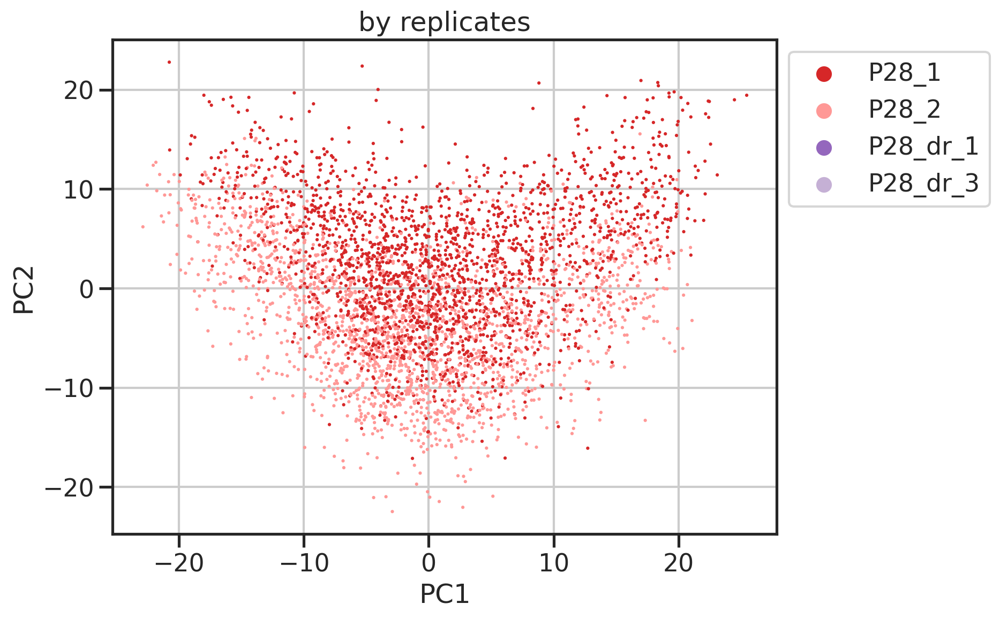

In [26]:
fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='PC1', y='PC2', 
                hue='biosamp',
                hue_order=list(palette_biosamp.keys()),
                palette=palette_biosamp,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
ax.set_title('by replicates')
plt.show()

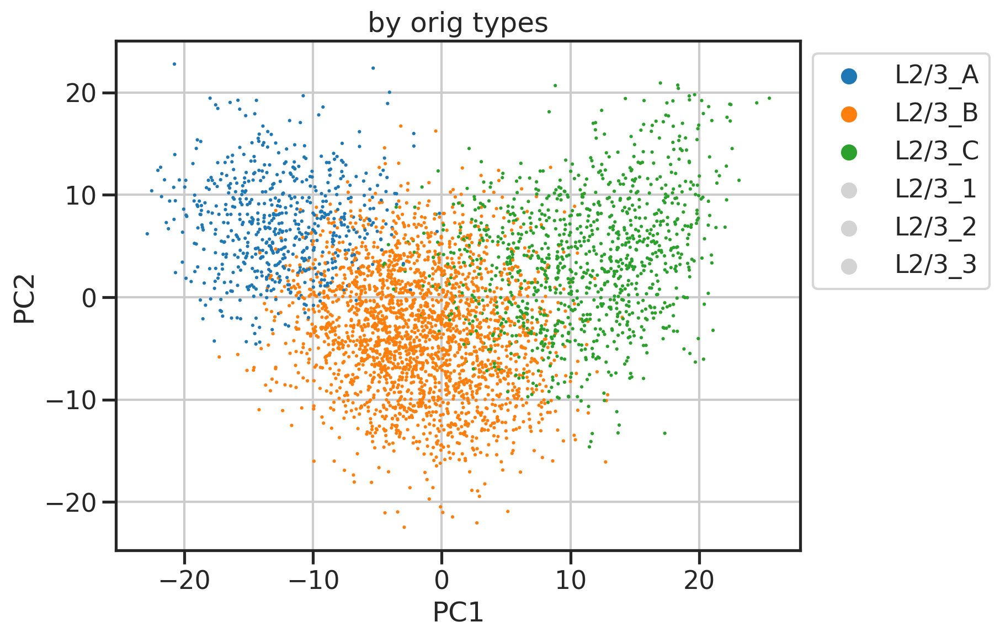

In [27]:
fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='PC1', y='PC2', 
                hue='type',
                hue_order=list(palette_type_abc.keys()),
                palette=palette_type_abc,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
ax.set_title('by orig types')
plt.show()

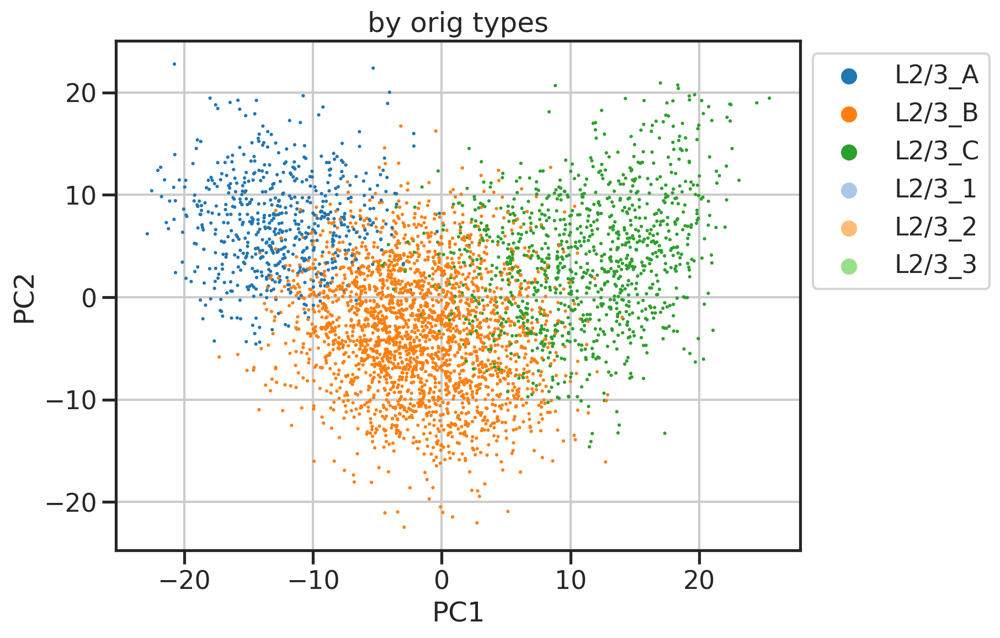

In [28]:
fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='PC1', y='PC2', 
                hue='type',
                hue_order=list(palette_type.keys()),
                palette=palette_type,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
ax.set_title('by orig types')
plt.show()

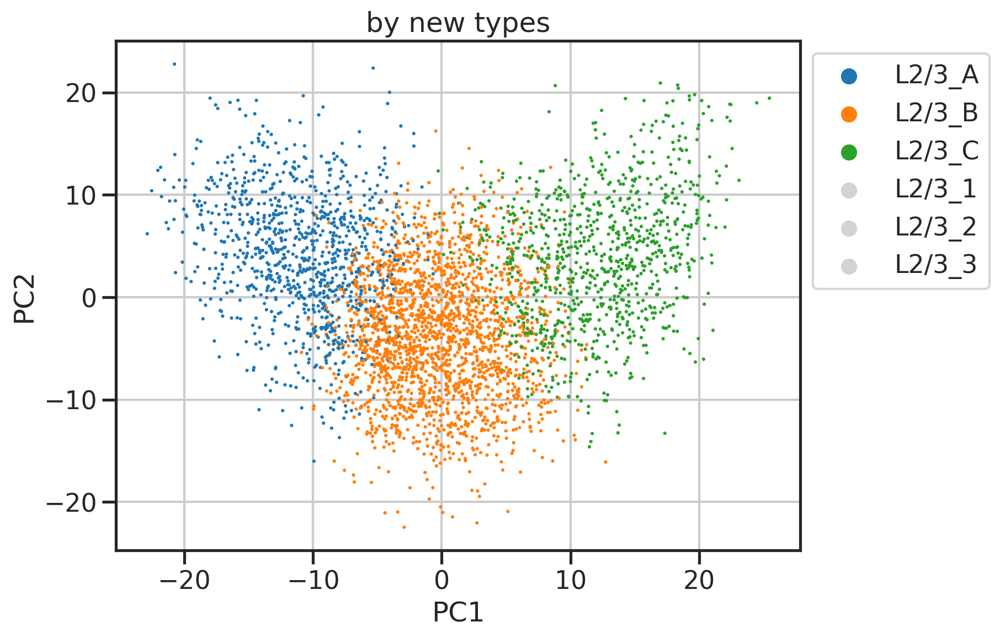

In [29]:
fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='PC1', y='PC2', 
                hue='newtype',
                hue_order=list(palette_type_abc.keys()),
                palette=palette_type_abc,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
ax.set_title('by new types')
plt.show()

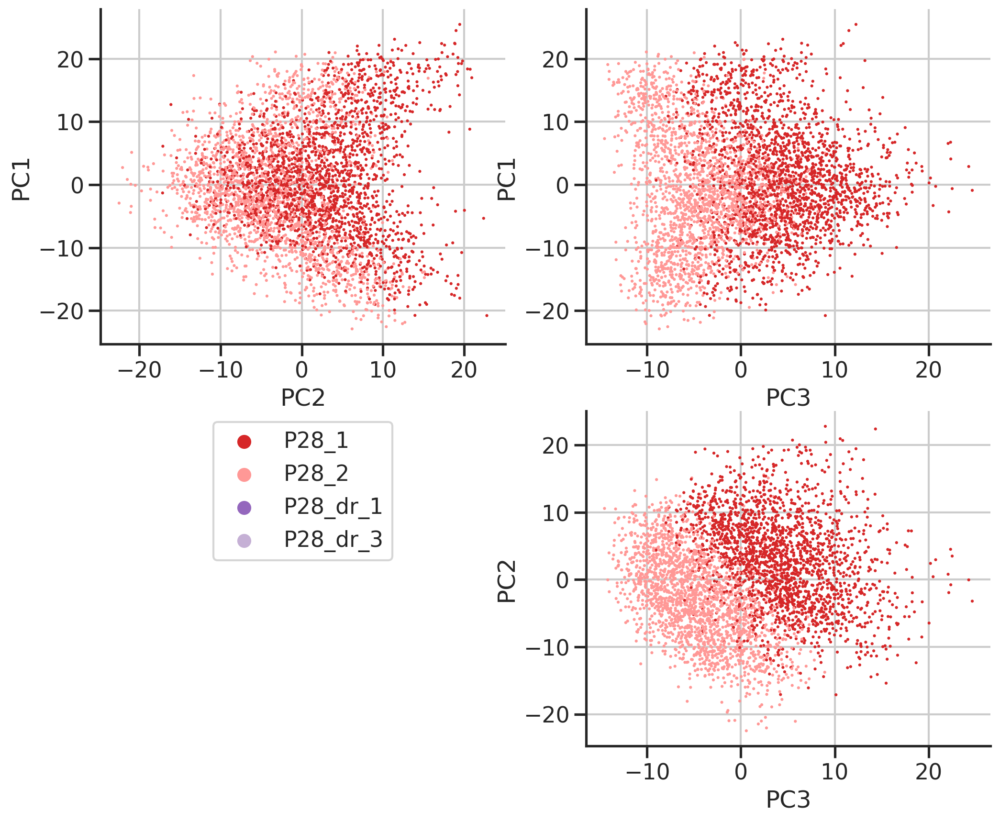

In [30]:
plot_pcs(res, 3, 'biosamp', palette=palette_biosamp)

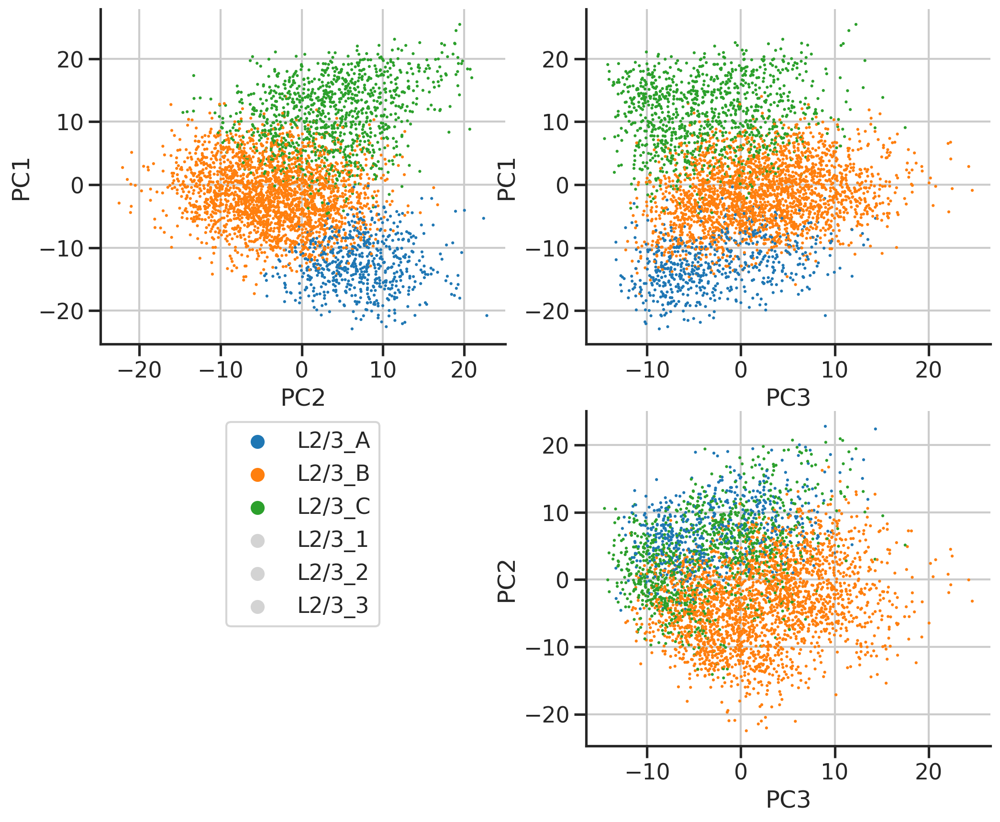

In [31]:
plot_pcs(res, 3, 'type', palette=palette_type_abc)

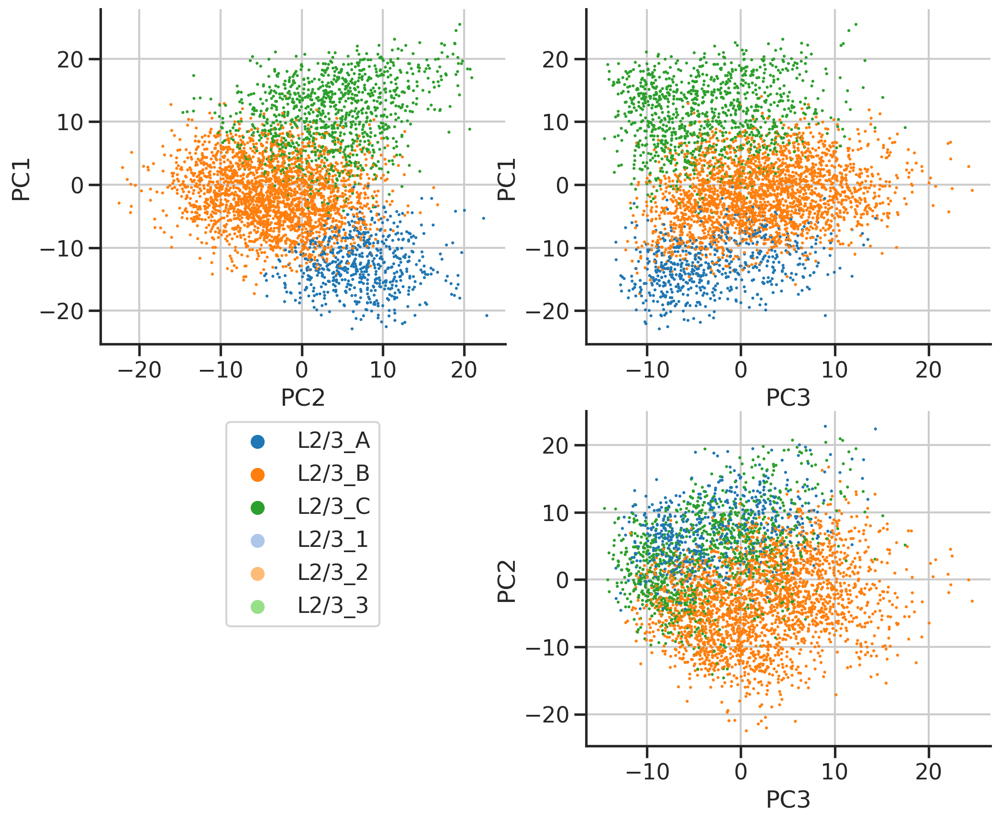

In [32]:
plot_pcs(res, 3, 'type', palette=palette_type)

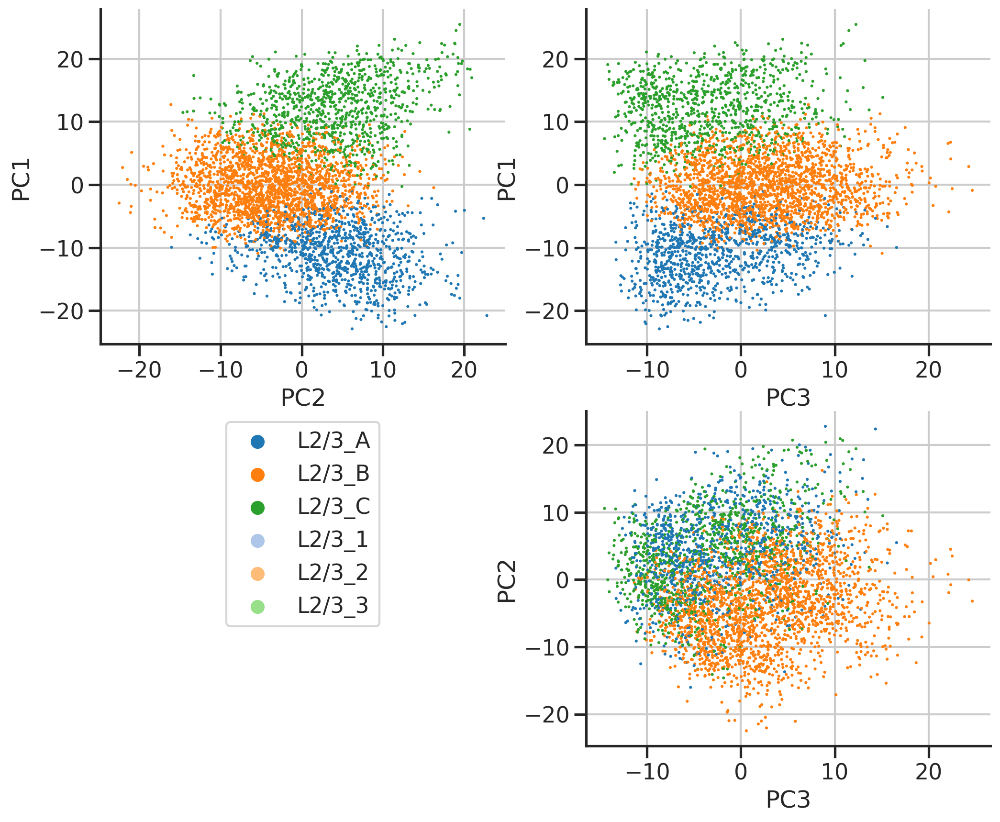

In [33]:
plot_pcs(res, 3, 'newtype', palette=palette_type)

# DR

In [34]:
res = res_dr

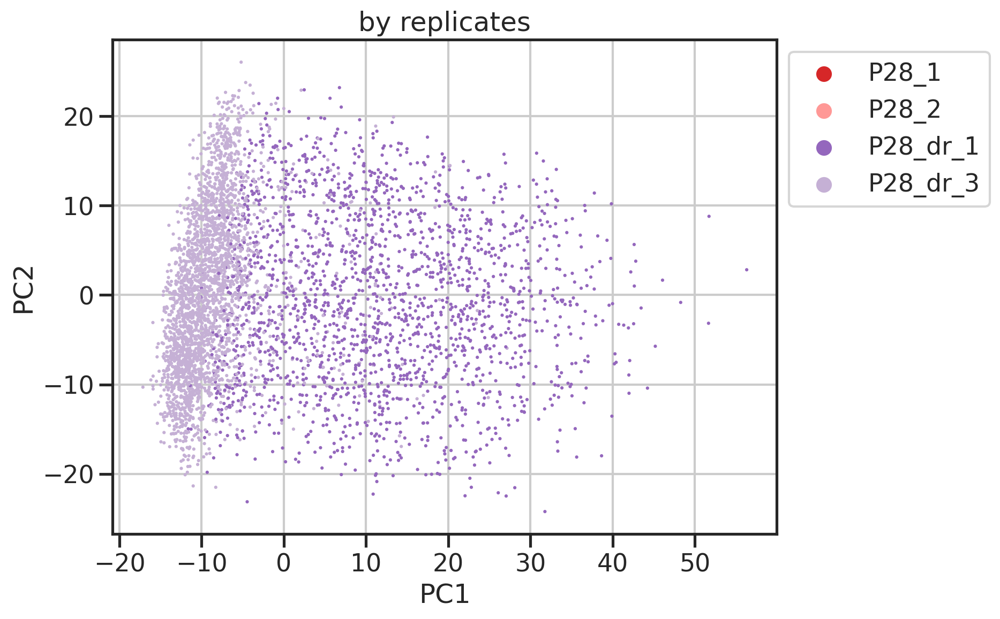

In [35]:
fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='PC1', y='PC2', 
                hue='biosamp',
                hue_order=list(palette_biosamp.keys()),
                palette=palette_biosamp,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
ax.set_title('by replicates')
plt.show()

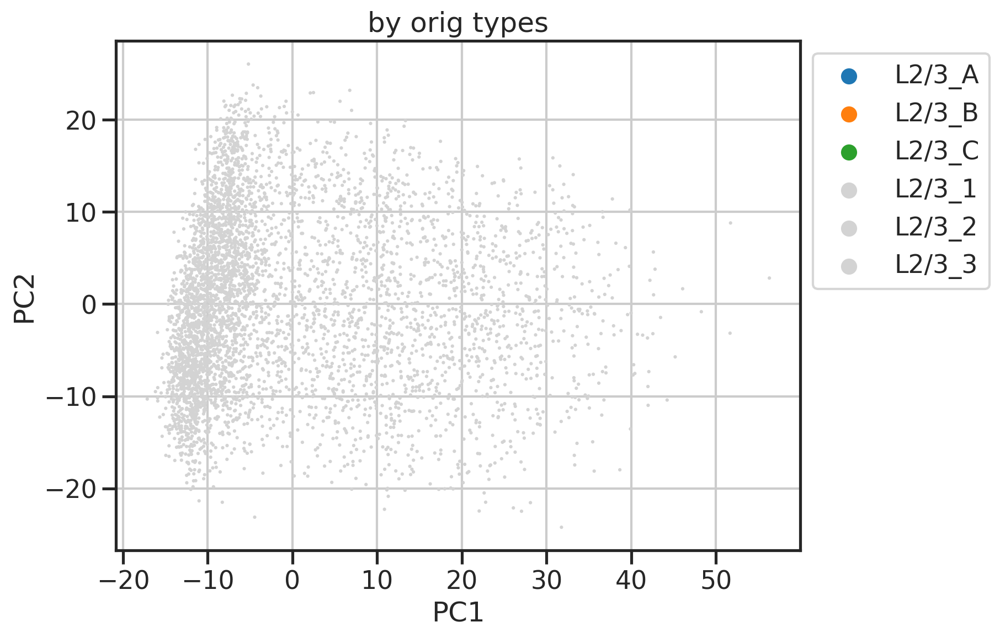

In [36]:
fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='PC1', y='PC2', 
                hue='type',
                hue_order=list(palette_type_abc.keys()),
                palette=palette_type_abc,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
ax.set_title('by orig types')
plt.show()

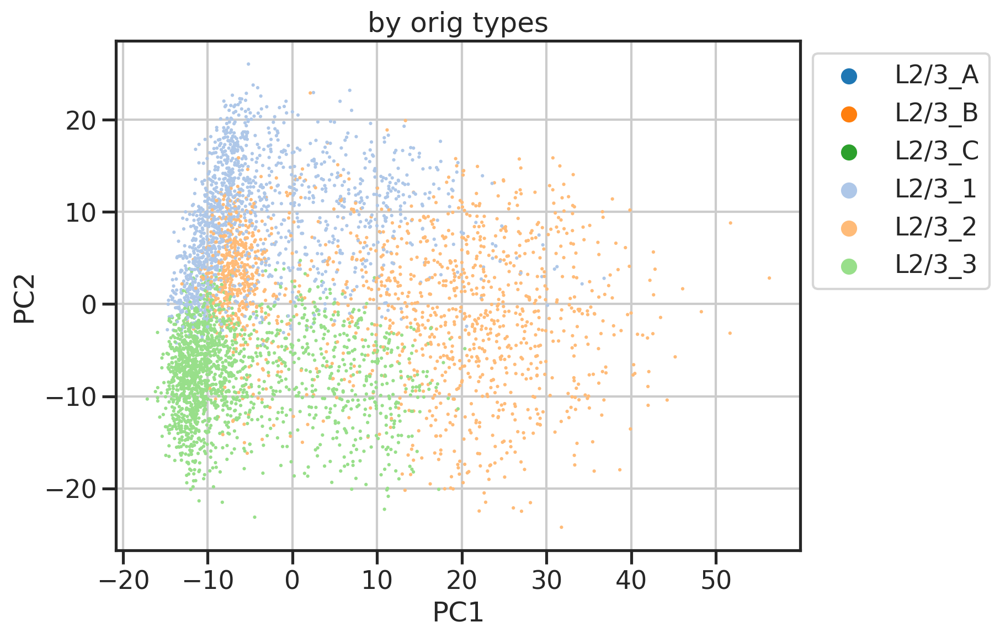

In [37]:
fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='PC1', y='PC2', 
                hue='type',
                hue_order=list(palette_type.keys()),
                palette=palette_type,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
ax.set_title('by orig types')
plt.show()

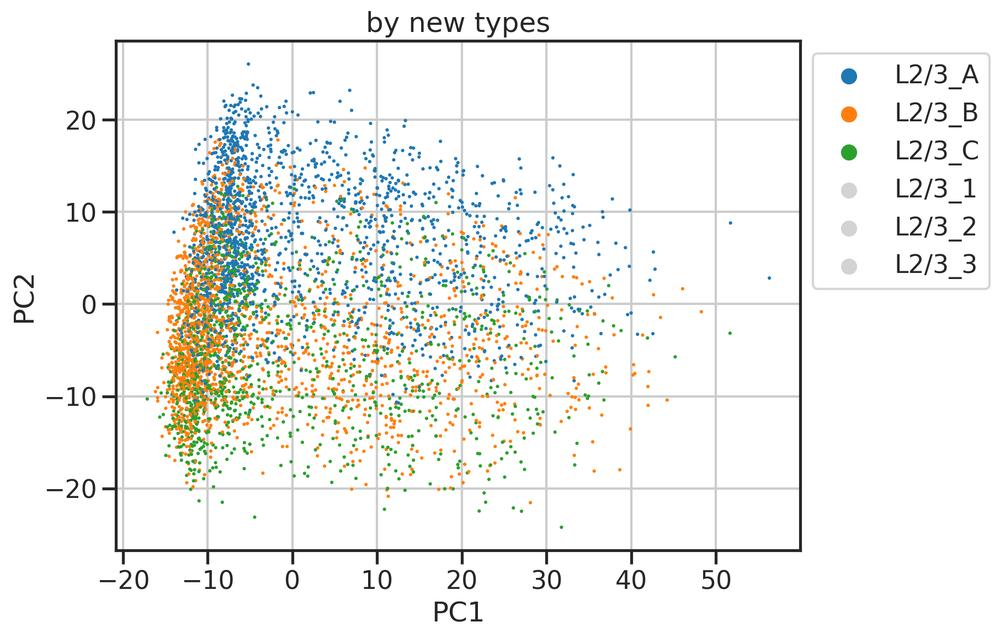

In [38]:
fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='PC1', y='PC2', 
                hue='newtype',
                hue_order=list(palette_type_abc.keys()),
                palette=palette_type_abc,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
ax.set_title('by new types')
plt.show()

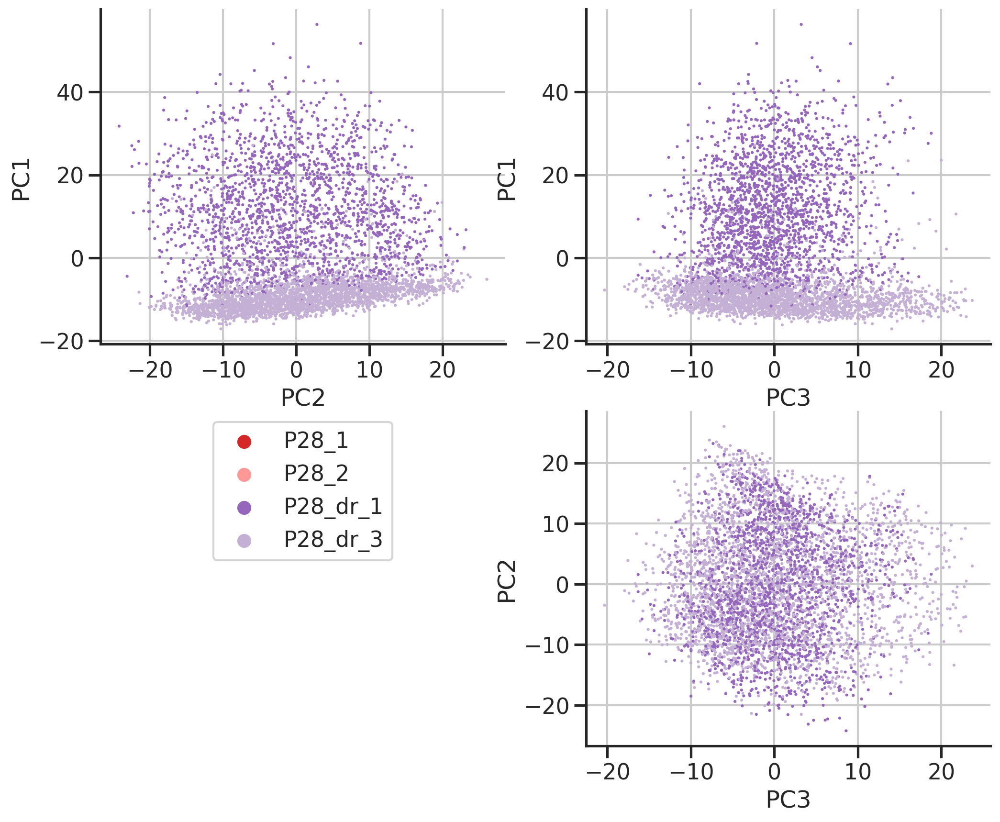

In [39]:
plot_pcs(res, 3, 'biosamp', palette=palette_biosamp)

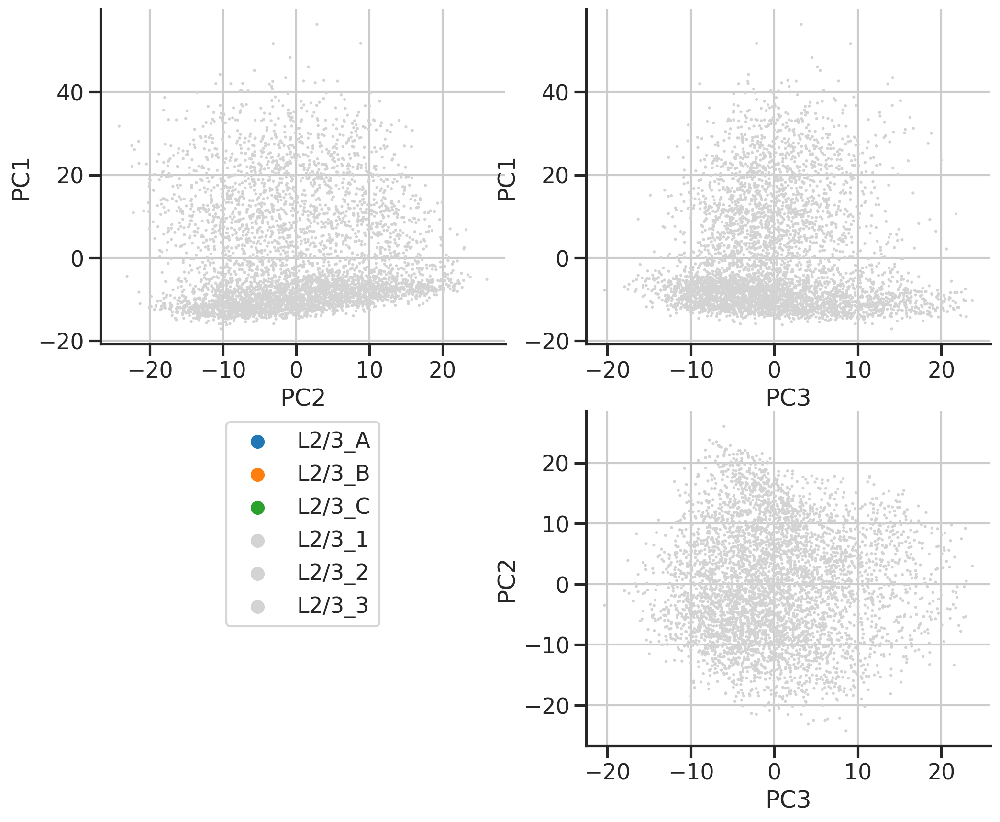

In [40]:
plot_pcs(res, 3, 'type', palette=palette_type_abc)

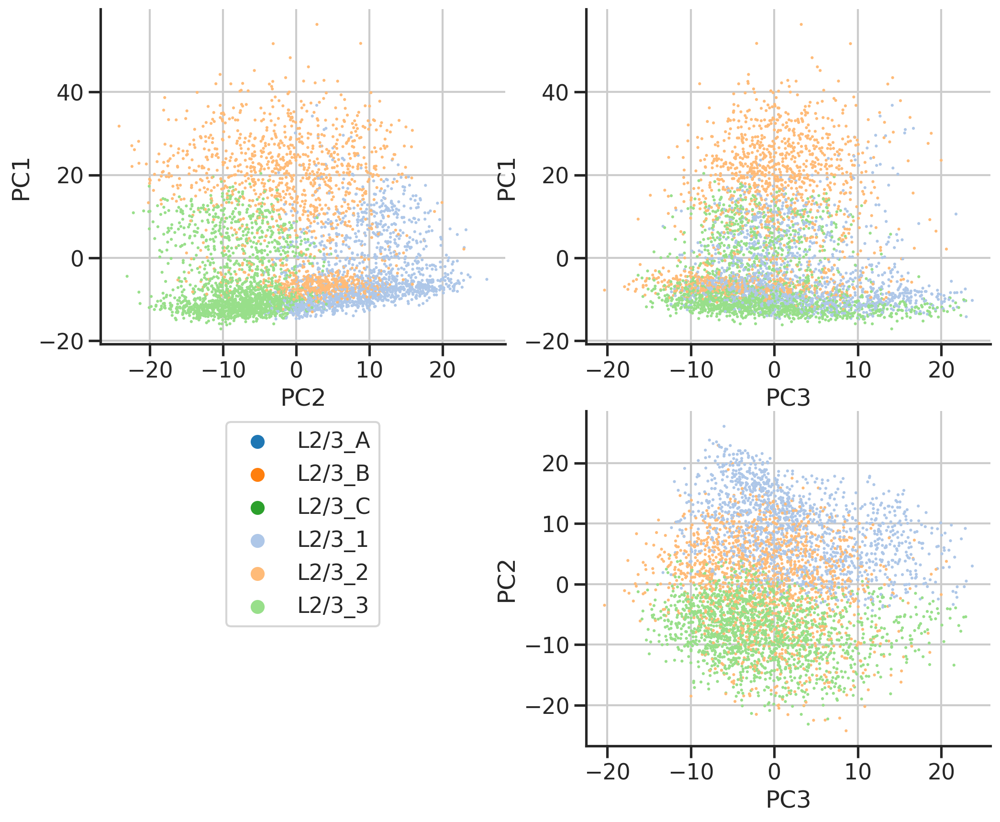

In [41]:
plot_pcs(res, 3, 'type', palette=palette_type)

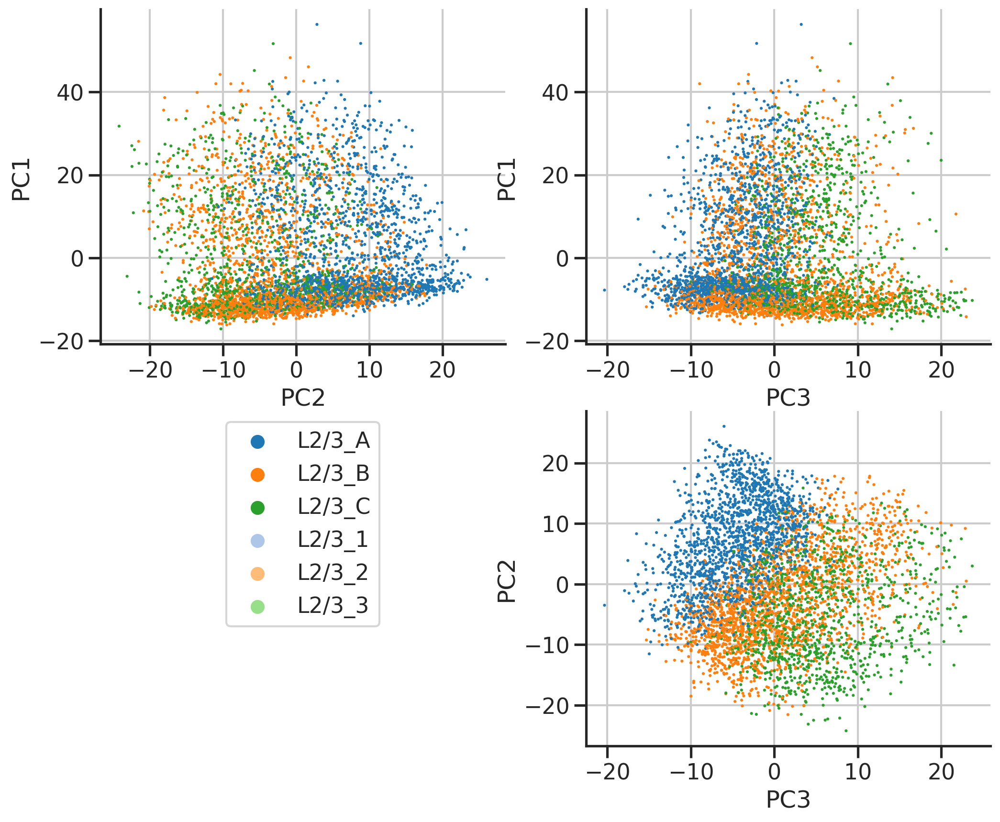

In [42]:
plot_pcs(res, 3, 'newtype', palette=palette_type)